## Bioenformatic Algorithms
Author: Emre Kenar 
  
Slides are taken from Bioinformatics Algorithms: An Active Learning Approach. 2020 Compeau and Pevzner.    
  
Algorithms:  
1. Frequent words problem
2. Reverse complement problem
3. Pattern matching problem
4. Clump finding problem
5. Median string problem
6. Greedy motif search
7. Randomized motif search
8. Gibbs sampling motif search
9. String composition problem
10. Overlap graph problem
11. De Bruijn graph from k-mers problem
12. Eulerian cycle problem
13. Pattern translation problem
14. Generating theoretical spectrum problem
15. Cyclopeptide scoring problem
16. Longest common subsequence problem
17. Global alignment problem
18. Number of breakpoints problem
19. Additive phylogeny
20. UPGMA
21. k-means clustering problem
22. Hierarchical clustering problem
23. Trie construction problem
24. Suffix tree construction problem

### 1. Frequent words problem

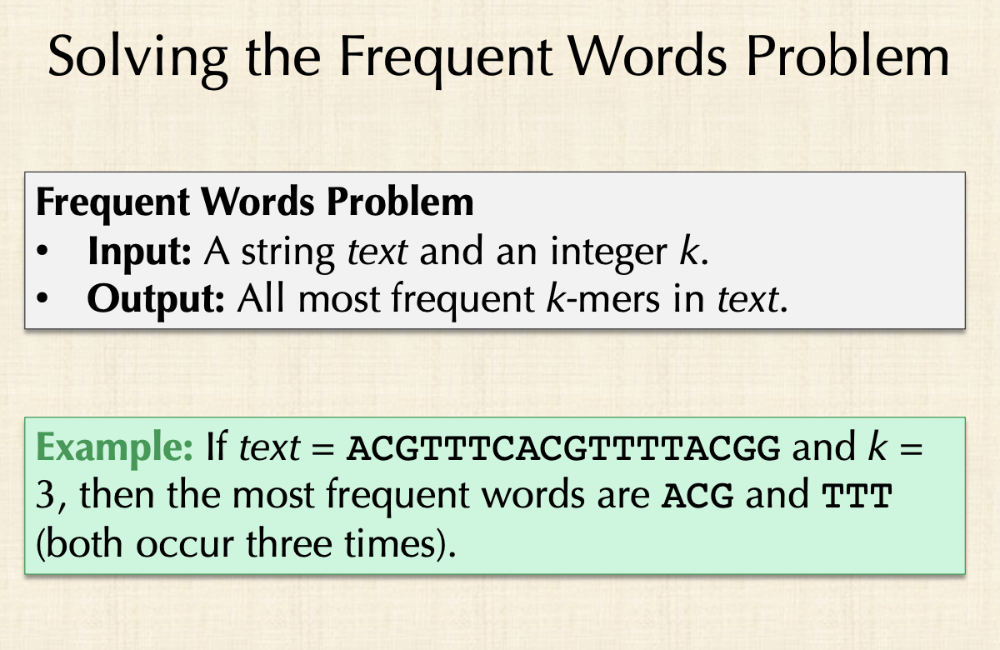

In [1]:
def frequent_words(string, k):
    frequent_patterns = []
    length = len(string)
    occurences = dict()
    max_occurence = 0
    
    # find n occurences
    for i in range(length - k):
        k_mer = string[i:i+k]
        if k_mer not in occurences.keys():
            occurences[k_mer] = 1
        else:
            occurences[k_mer] += 1
        # record maximum occurence
        if occurences[k_mer] > max_occurence:
            max_occurence = occurences[k_mer]
    
    # find the most frequent k-mers
    for k_mer, occ in occurences.items():
        if occ == max_occurence:
            frequent_patterns.append(k_mer)
    
    return frequent_patterns

In [2]:
frequent_words_test = frequent_words('acgtttcacgttttacgg', 3)
print(frequent_words_test)

['acg', 'ttt']


### 2. Reverse complement problem

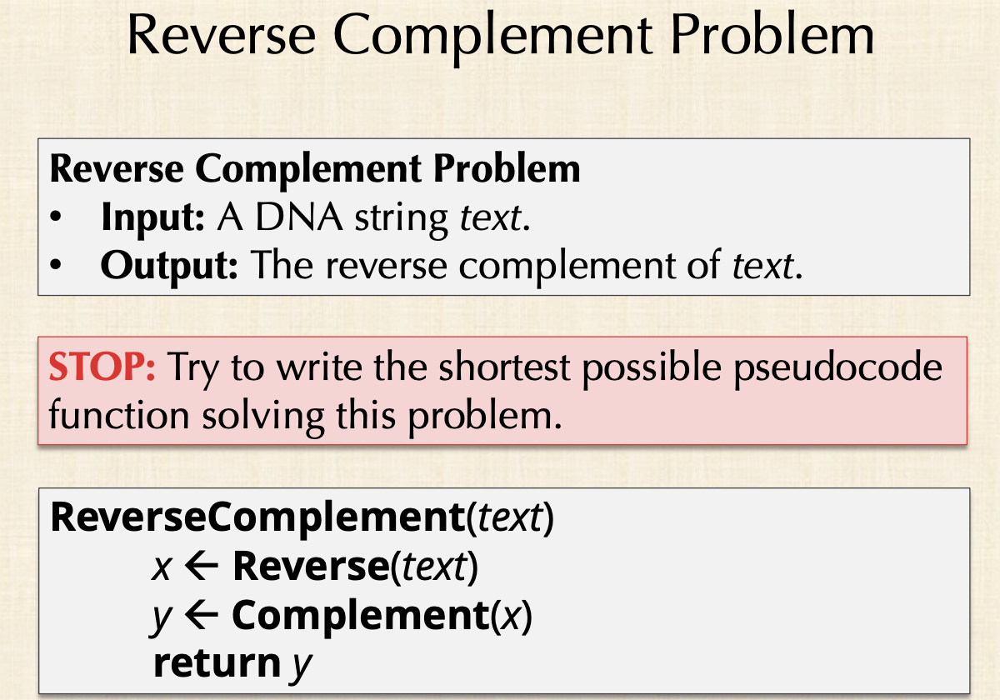

In [3]:
reverses = {
    'a': 't',
    't': 'a',
    'g': 'c',
    'c': 'g'
}

def reverse_complement(string):
    result = ''
    length = len(string)
    
    for i in range(length - 1, -1, -1):
        result += reverses[string[i]]
    
    return result

In [4]:
reverse_complement_test = reverse_complement('aactgcgttac')
print(reverse_complement_test)

gtaacgcagtt


### 3. Pattern matching problem

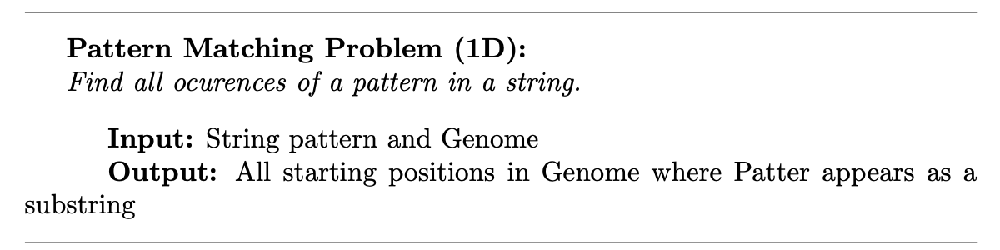

In [5]:
def pattern_matching(pattern, genome):
    positions = []
    len_genome = len(genome)
    len_pattern = len(pattern)

    for i in range(len_genome - len_pattern + 1):
        if genome[i:i+len_pattern] == pattern:
            positions.append(i)
    
    return positions

In [6]:
pattern_matching_test = pattern_matching('cc', 'acctgagccctgcc')
print(pattern_matching_test)

[1, 7, 8, 12]


### 4. Clump finding problem

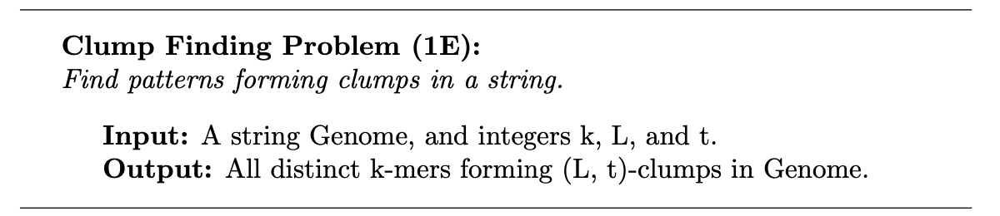

In [7]:
def find_clumps(genome, k, L, t):
    clump_k_mers = list()
    occurences = dict()
    length = len(genome)
    
    for i in range(length - L + 1):
        
        # find n occurences of k-mers for ith window
        occurences[i] = dict()
        for j in range(i, i + L - k + 1):
            k_mer = genome[j:j+k]
            if k_mer not in occurences[i].keys():
                occurences[i][k_mer] = 1
            else:
                occurences[i][k_mer] += 1
                
            # if there are at least t k-mers in the L-window
            # k-mer forms an (L,t)-clump
            if occurences[i][k_mer] >= t and k_mer not in clump_k_mers:
                clump_k_mers.append(k_mer)

    return clump_k_mers

In [8]:
find_clumps_test = find_clumps('cccaccgtgtcgaccagcct', k=2, L=5, t=2)
print(find_clumps_test)

['cc', 'gt']


### 5. Median string problem

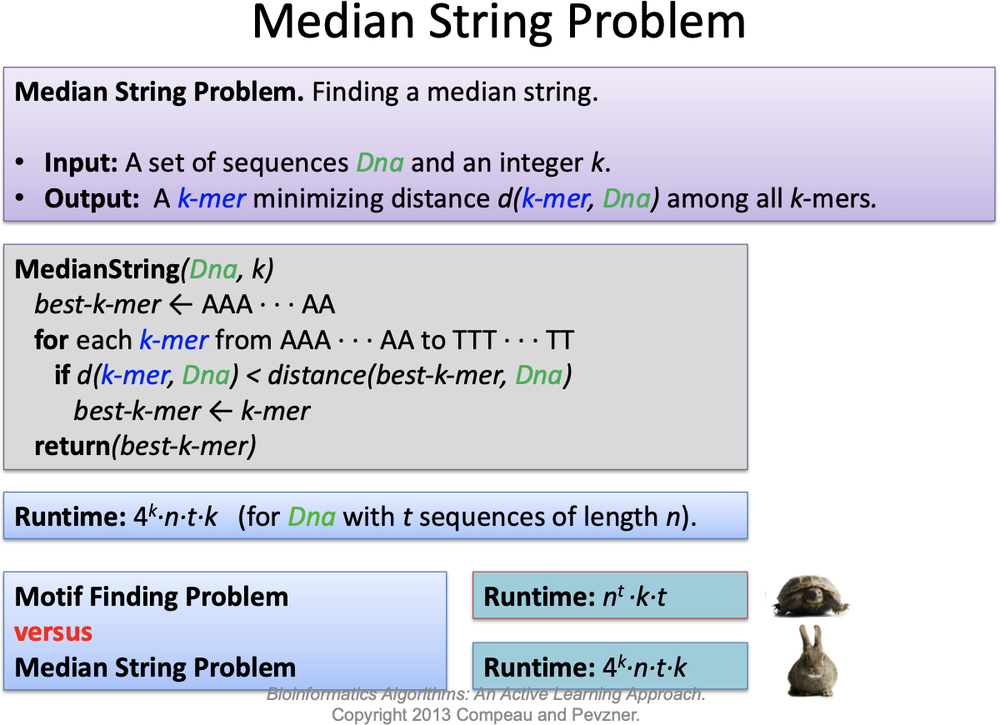

In [9]:
from random import randrange, uniform

In [10]:
# list of possible letters
letters = ['a', 'c', 'g', 't']


def base4(k, n):
    """
    :param k: length
    :param n: number in base 10
    :return: number in base 4, length k
    """
    result = []
    while n > 0:
        result.insert(0, n % 4)
        n = n // 4
    for _ in range(k - len(result)):
        result.insert(0, 0)
    return result


def generate_all_k_mers(k):
    """
    :param k: length
    :return: all k-mers possible
    """
    all_k_mers = []
    for i in range(4 ** k):
        k_mer = ''
        for j in base4(k, i):
            k_mer += letters[j]
        all_k_mers.append(k_mer)
    return all_k_mers

def score(string, k_mer):
    k = len(k_mer)
    min_dist = k
    for i in range(len(string) - k):
        dist = 0
        for j in range(k):
            if string[i + j] != k_mer[j]:
                dist += 1
        if dist < min_dist:
            min_dist = dist
    return min_dist


def most_probable_motif(profile):
    motif = ''
    for probs in profile.values():
        max_prob = probs['a']
        most_prob = 'a'
        for letter in letters[1:]:
            if probs[letter] > max_prob:
                max_prob = probs[letter]
                most_prob = letter
        motif += most_prob
    return motif


def generate_profile(dna_strings):
    len_string = len(dna_strings[0])
    n_strings = len(dna_strings)
    profile = {index: {letter: 0.0 for letter in letters} for index in range(len_string)}
    for index in range(len_string):
        for string in dna_strings:
            letter = string[index]
            profile[index][letter] += 1.0 / n_strings
    return profile

def median_string_search(dna_strings, k):
    """
    :param dna_strings: list of dna strings
    :param k: length
    :return: a k-mer pattern minimizing d(pattern, dna) among all possible choices of k-mers
    """

    frequency_map = {k_mer: 0 for k_mer in generate_all_k_mers(k)}

    for string in dna_strings:
        for k_mer in frequency_map.keys():
            min_dist = score(string, k_mer)
            frequency_map[k_mer] += min_dist

    median_string = min(frequency_map, key=frequency_map.get)
    return median_string

In [11]:
median_string = median_string_search(
    [
        'ttaccttaac',
        'gatatctgtc',
        'acggcgttcg',
        'ccctaaagag',
        'cgtcagaggt'
    ], 3)
print(median_string)

cct


### 6. Greedy motif search

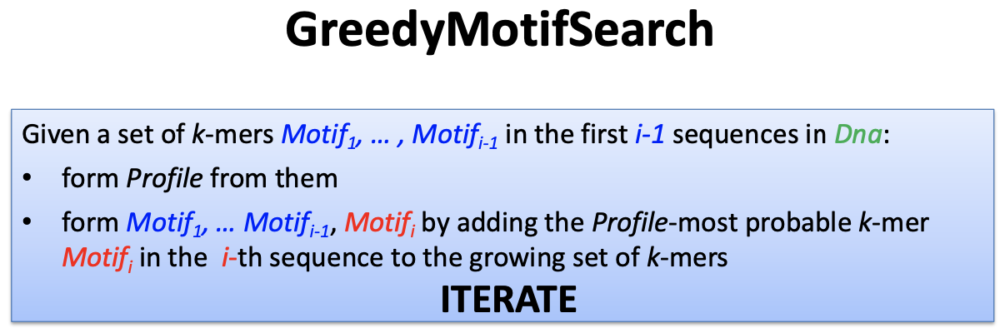

In [12]:
def profile_most_probable_k_mer(string, profile, k):
    k_mers = set()
    for i in range(len(string) - k + 1):
        k_mers.add(string[i:i+k])
    probabilities = {k_mer: 0.0 for k_mer in k_mers}
    for i in range(len(string) - k + 1):
        k_mer = string[i:i+k]
        prob = 1.0
        for j in range(k):
            letter = string[i + j]
            prob *= profile[j][letter]
        probabilities[k_mer] += prob
    best_k_mer = max(probabilities, key=probabilities.get)
    return best_k_mer


def greedy_motif_search(dna_strings, k, t=0):
    """
    use a greedy strategy to find motifs
    :param dna_strings: a list of dna strings
    :param k: length of mer
    :param t: unnecessary length of dna_strings
    :return: a motif matrix minimizing score(motifs) among all possible choices of k-mers
    """

    # initially take the first k-mers
    best_motifs = []
    for string in dna_strings:
        best_motifs.append(string[:k])

    # find general best motif
    profile_all = generate_profile(dna_strings)
    best_motif_all = most_probable_motif(profile_all)

    # for each k-mer in the first string
    for index in range(len(dna_strings[0]) - k + 1):
        motifs = [dna_strings[0][index:index+k]]

        # for every other string
        for i in range(1, len(dna_strings)):
            # update the profile
            profile = generate_profile(dna_strings[:i])
            # add profile-most probable k-mer in ith string
            new_motif = profile_most_probable_k_mer(dna_strings[i], profile, k)
            motifs.append(new_motif)

        # find the scores
        score_motifs = 0
        score_best = 0
        for i in range(len(dna_strings)):
            score_motifs += score(best_motif_all, motifs[i])
            score_best += score(best_motif_all, best_motifs[i])

        # compare the scores and update best motifs
        if score_motifs < score_best:
            best_motifs = motifs

    return best_motifs

In [13]:
greedy_solution = greedy_motif_search(
    [
        'tcgggggttttt',
        'ccggtgacttac',
        'acggggattttc',
        'ttggggactttt',
        'aaggggacttcc',
        'ttggggacttcc',
        'tcggggattcat',
        'tcggggattcct',
        'taggggaactac',
        'tcgggtataacc'
    ], 3)
print(greedy_solution)

['tcg', 'ctt', 'gat', 'ctt', 'ctt', 'ttg', 'tcg', 'tcg', 'tag', 'tcg']


### 7. Randomized motif search

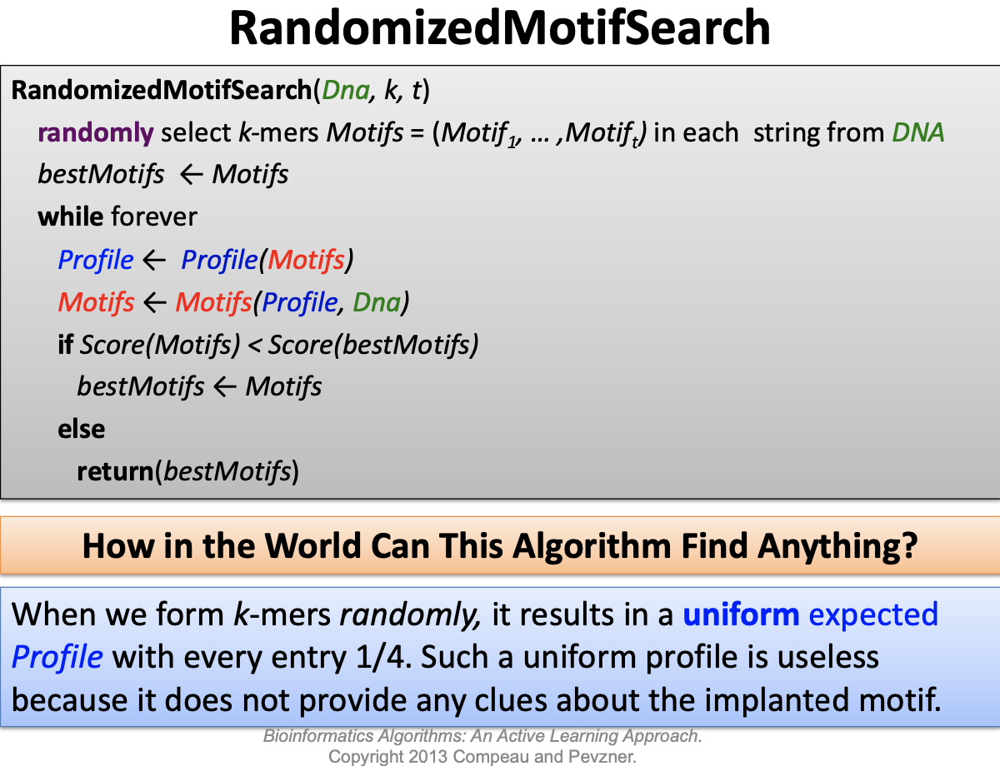

In [14]:
def randomized_motif_search(dna_strings, k, t=0):
    """
    use a randomized strategy to find motifs
    :param dna_strings: a list of dna strings
    :param k: length of mer
    :param t: unnecessary length of dna_strings
    :return: a motif matrix minimizing score(motifs) among all possible choices of k-mers
    """

    # define helper variables
    n_strings = len(dna_strings)
    len_string = len(dna_strings[0])

    # initially take random k-mers
    best_motifs = []
    for string in dna_strings:
        i = randrange(0, len_string - k)
        best_motifs.append(string[i:i+k])
    motifs = best_motifs

    # find general best motif
    profile_all = generate_profile(dna_strings)
    best_motif_all = most_probable_motif(profile_all)

    while True:
        # update the profile
        profile = generate_profile(motifs)

        # update the motifs
        motifs = []
        for i in range(n_strings):
            new_motif = profile_most_probable_k_mer(dna_strings[i], profile, k)
            motifs.append(new_motif)

        # find the scores
        score_motifs = 0
        score_best = 0
        for i in range(len(dna_strings)):
            score_motifs += score(best_motif_all, motifs[i])
            score_best += score(best_motif_all, best_motifs[i])

        # compare the scores and update best motifs
        if score_motifs < score_best:
            best_motifs = motifs
        else:
            return best_motifs

In [15]:
randomized_solution = randomized_motif_search(
    [
        'ttaccttaac',
        'gatgtctgtc',
        'ccggcgttag',
        'cactaaccag',
        'cgtcagaggt'
    ], 3)
print(randomized_solution)

['cct', 'ctg', 'ccg', 'cag', 'cag']


### 8. Gibbs sampling motif search

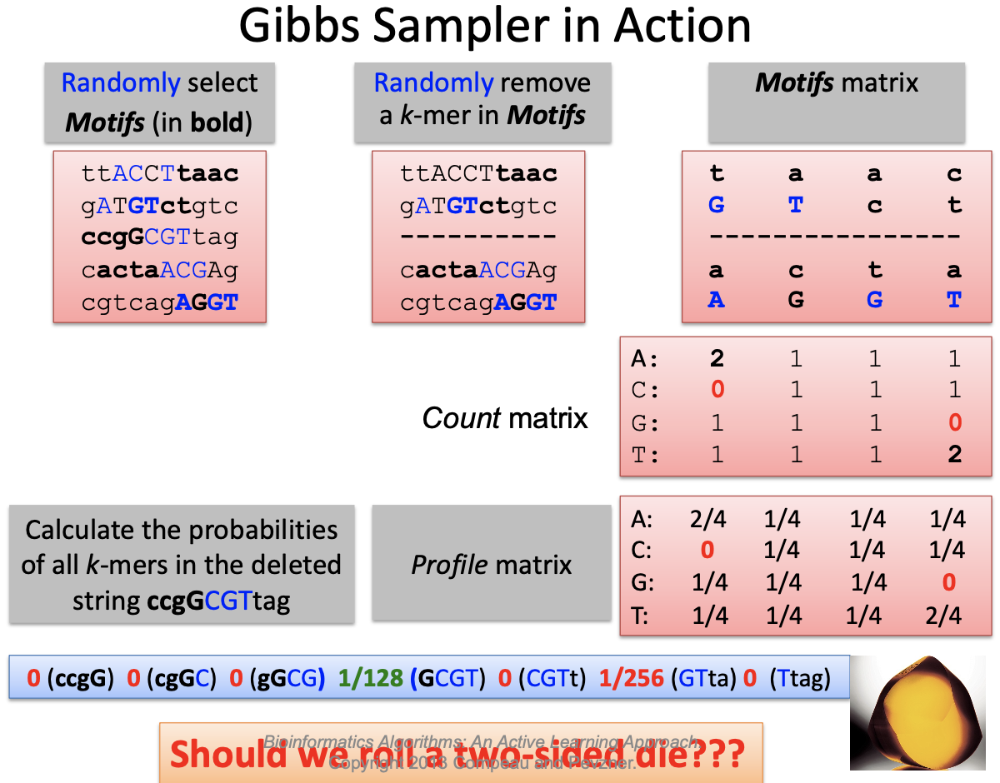

In [16]:
def gibbs_sampling_motif_search(dna_strings, k, t=0):
    """
    use the gibbs sampling strategy to find motifs
    :param dna_strings: a list of dna strings
    :param k: length of mer
    :param t: unnecessary length of dna_strings
    :return: a motif matrix minimizing score(motifs) among all possible choices of k-mers
    """

    # define helper variables
    n_strings = len(dna_strings)
    len_string = len(dna_strings[0])

    # initially take random k-mers
    best_motifs = []
    for string in dna_strings:
        i = randrange(0, len_string - k)
        best_motifs.append(string[i:i+k])
    motifs = best_motifs

    # find general best motif for scoring
    profile_all = generate_profile(dna_strings)
    best_motif_all = most_probable_motif(profile_all)

    while True:
        # select the stable k-mer
        i = randrange(0, n_strings)
        # remove this item from the motifs
        motifs.pop(i)
        # form the profile from the remaining k-mers
        profile = generate_profile(motifs)

        # calculate P(k-mer|Profile)s
        probabilities = [1.0 for _ in motifs]
        for motif in motifs:
            for j in range(k):
                probabilities[j] *= profile[j][motif[j]]

        # normalize the probabilities
        sum_probs = sum(probabilities)
        normalized_probabilities = probabilities.copy()
        for j in range(len(motifs)):
            normalized_probabilities[j] /= sum_probs

        # find cumulative sums
        cumulative_probabilities = []
        cum_sum = 0.0
        for j in range(len(motifs)):
            cum_sum += normalized_probabilities[j]
            cumulative_probabilities.append(cum_sum)

        # determine the new starting position
        i = uniform(0.0, 1.0)
        new_starting_position = 0
        for j, cum_sum in enumerate(cumulative_probabilities):
            if i <= cum_sum:
                new_starting_position = j

        motifs.append(motifs[new_starting_position])

        # find the scores
        score_motifs = 0
        score_best = 0
        for i in range(len(dna_strings)):
            score_motifs += score(best_motif_all, motifs[i])
            score_best += score(best_motif_all, best_motifs[i])

        # compare the scores and update best motifs
        if score_motifs < score_best:
            best_motifs = motifs
        else:
            return best_motifs

In [17]:
gibbs_solution = gibbs_sampling_motif_search(
    [
        'ttaccttaac',
        'gatgtctgtc',
        'ccggcgttag',
        'cactaaccag',
        'cgtcagaggt'
    ], 3)
print(gibbs_solution)

['atg', 'cgg', 'cta', 'cgt', 'cgt']


### 9. String composition problem

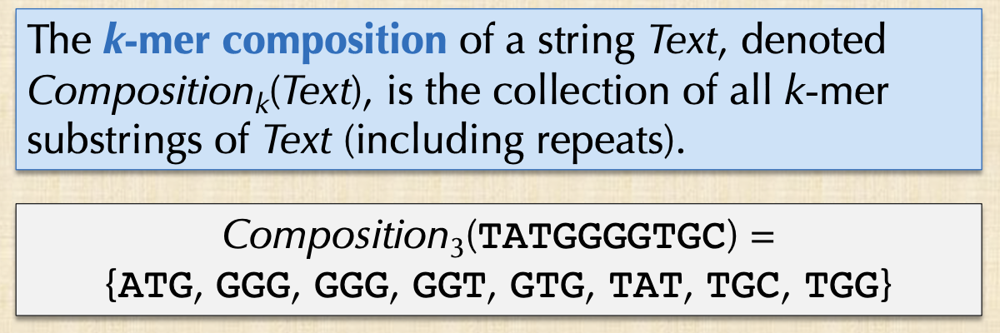

In [18]:
def string_composition(text, k):
    # find all unique k-mers
    k_mers_set = set()
    len_text = len(text)
    for i in range(len_text - k):
        k_mers_set.add(text[i:i+k])

    # sort k-mers lexicographically
    k_mers = list(k_mers_set)
    k_mers.sort()

    return k_mers

In [19]:
string_composition_test = string_composition('atcgggaatcg', 3)
print(string_composition_test)

['aat', 'atc', 'cgg', 'gaa', 'gga', 'ggg', 'tcg']


### 10. Overlap graph problem

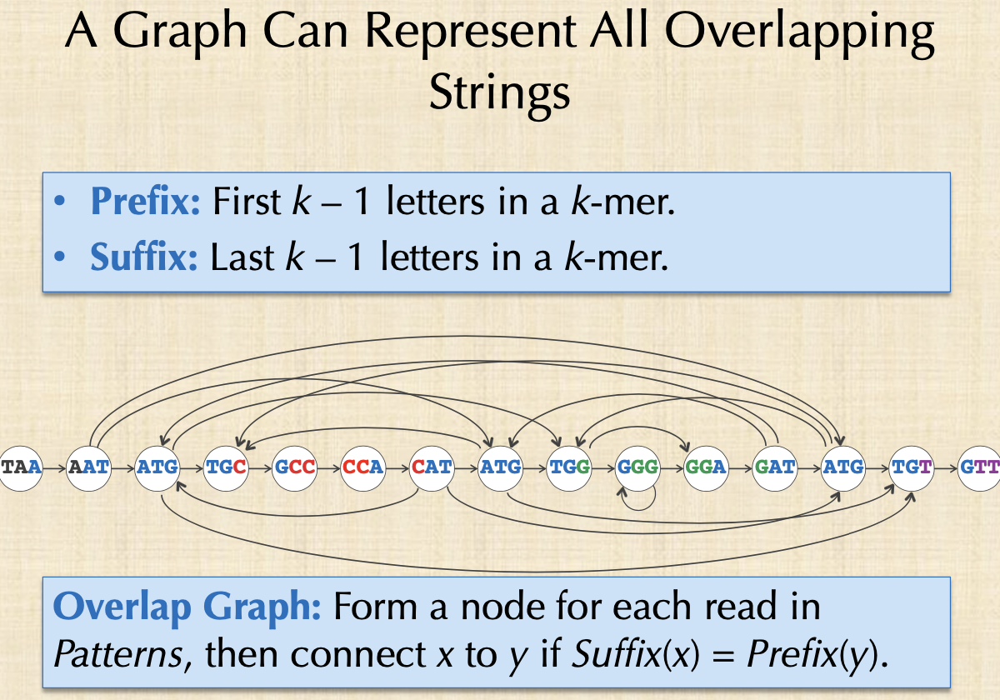

In [20]:
class Graph:
    # basic graph representation

    def __init__(self):
        self.v = list()
        self.e = dict()

    def __str__(self):
        s = 'vertices: ' + self.v.__str__()
        for v, e in self.e.items():
            s += '\nedges of vertex ' + v + ': ' + e.__str__()
        return s

def overlap_graph(k_mers):
    # create an empty graph
    graph = Graph()

    # fill out the vertices
    for k_mer in k_mers:
        graph.v.append(k_mer)

    # fill out the edges
    for k_mer1 in k_mers:
        graph.e[k_mer1] = list()
        for k_mer2 in k_mers:
            # if prefix of k_mer1 is equal to suffix of k_mer2, connect
            if k_mer1 != k_mer2 and k_mer1[1:] == k_mer2[:-1]:
                graph.e[k_mer1].append(k_mer2)

    return graph

In [21]:
overlap_graph_test = overlap_graph(
    [
        'taa', 'aat', 'atg', 'gtt', 'tgt', 'atg', 'tgc',
        'gcc', 'cca', 'gat', 'gga', 'ggg', 'cat', 'atg'
    ])
print(overlap_graph_test)

vertices: ['taa', 'aat', 'atg', 'gtt', 'tgt', 'atg', 'tgc', 'gcc', 'cca', 'gat', 'gga', 'ggg', 'cat', 'atg']
edges of vertex taa: ['aat']
edges of vertex aat: ['atg', 'atg', 'atg']
edges of vertex atg: ['tgt', 'tgc']
edges of vertex gtt: []
edges of vertex tgt: ['gtt']
edges of vertex tgc: ['gcc']
edges of vertex gcc: ['cca']
edges of vertex cca: ['cat']
edges of vertex gat: ['atg', 'atg', 'atg']
edges of vertex gga: ['gat']
edges of vertex ggg: ['gga']
edges of vertex cat: ['atg', 'atg', 'atg']


### 11. De Bruijn graph from k-mers problem

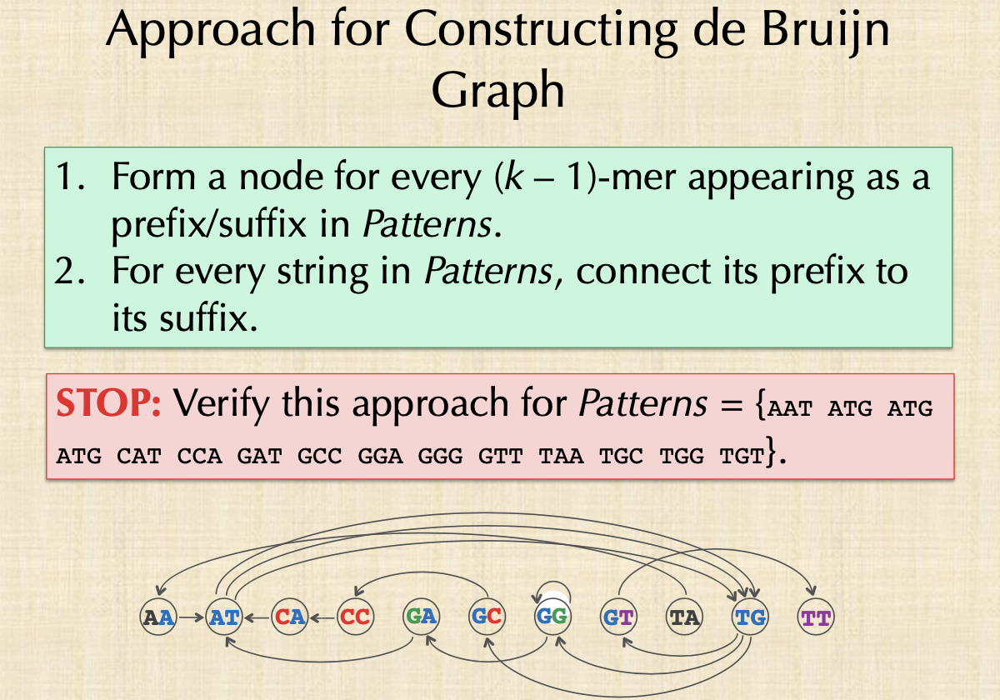

In [22]:
def de_bruijn_graph(k_mers):
    graph = Graph()

    for k_mer in k_mers:
        prefix = k_mer[:-1]
        suffix = k_mer[1:]
        for v in [prefix, suffix]:
            # if prefix or suffix is not previously encountered
            if v not in graph.v:
                # create vertex and empty edge list
                graph.v.append(v)
                graph.e[v] = list()
        # draw an edge from prefix to suffix
        graph.e[prefix].append(suffix)

    return graph

In [23]:
de_bruijn_graph_test = de_bruijn_graph(
    [
        'aat', 'atg', 'atg', 'atg', 'cat', 'cca', 'gat', 'gcc',
        'gga', 'ggg', 'gtt', 'taa', 'tgc', 'tgg', 'tgt'         
    ])
print(de_bruijn_graph_test)

vertices: ['aa', 'at', 'tg', 'ca', 'cc', 'ga', 'gc', 'gg', 'gt', 'tt', 'ta']
edges of vertex aa: ['at']
edges of vertex at: ['tg', 'tg', 'tg']
edges of vertex tg: ['gc', 'gg', 'gt']
edges of vertex ca: ['at']
edges of vertex cc: ['ca']
edges of vertex ga: ['at']
edges of vertex gc: ['cc']
edges of vertex gg: ['ga', 'gg']
edges of vertex gt: ['tt']
edges of vertex tt: []
edges of vertex ta: ['aa']


### 12. Eulerian cycle problem

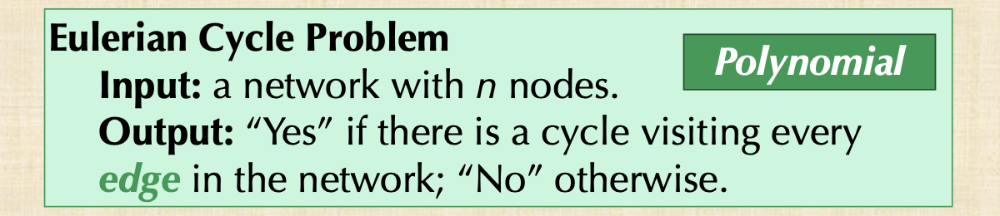

In [24]:
def eulerian_cycle(graph):
    # convert edges to vertex tuples
    directed_edges = []
    for v1, e in graph.e.items():
        for v2 in e:
            directed_edges.append((v1, v2))

    # recursively find eulerian cycle
    cycle = []
    # start from the first vertex
    cycle_helper(directed_edges[0][0], directed_edges, cycle)

    return cycle


def cycle_helper(vertex, edges, cycle):
    for v1, v2 in edges:
        # cycle found
        if v1 == vertex or v2 == vertex:
            # explored v1-v2 edge
            edges.remove((v1, v2))
            # explore other vertex
            if v1 == vertex:
                cycle_helper(v2, edges, cycle)
            else:
                cycle_helper(v1, edges, cycle)
    cycle.insert(0, vertex)

In [25]:
graph = Graph()
graph.v = [1, 2, 3, 4]
graph.e = {1: [2], 2: [3], 3: [1, 4], 4: [3]}
eulerian_cycle_test = eulerian_cycle(graph)
print(eulerian_cycle_test)

[1, 2, 3, 4, 3, 1]


### 13. Pattern translation problem

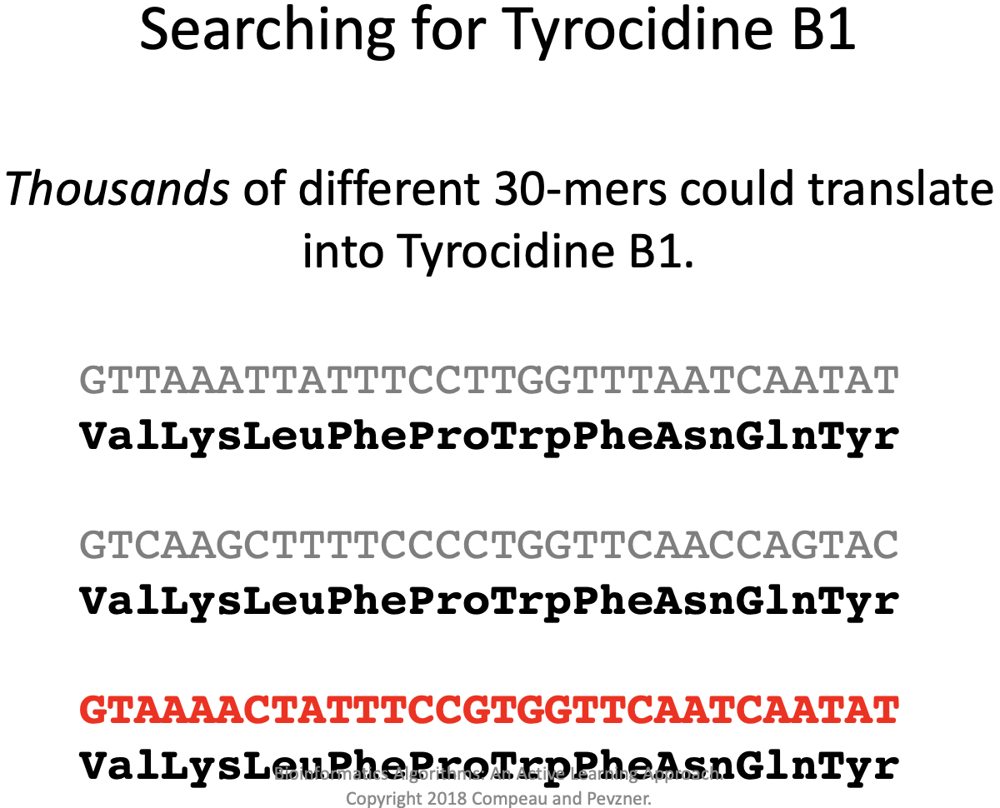

In [26]:
# codons and their amino acid abbreviations
GENETIC_CODE = {
    'AAA': 'Lys',
    'AAC': 'Asn',
    'AAG': 'Lys',
    'AAU': 'Asn',
    'ACA': 'Thr',
    'ACC': 'Thr',
    'ACG': 'Thr',
    'ACU': 'Thr',
    'AGA': 'Arg',
    'AGC': 'Ser',
    'AGG': 'Arg',
    'AGU': 'Ser',
    'AUA': 'Ile',
    'AUC': 'Ile',
    'AUG': 'Met',
    'AUU': 'Ile',
    'CAA': 'Gln',
    'CAC': 'His',
    'CAG': 'Gln',
    'CAU': 'His',
    'CCA': 'Pro',
    'CCC': 'Pro',
    'CCG': 'Pro',
    'CCU': 'Pro',
    'CGA': 'Arg',
    'CGC': 'Arg',
    'CGG': 'Arg',
    'CGU': 'Arg',
    'CUA': 'Leu',
    'CUC': 'Leu',
    'CUG': 'Leu',
    'CUU': 'Leu',
    'GAA': 'Glu',
    'GAC': 'Asp',
    'GAG': 'Glu',
    'GAU': 'Asp',
    'GCA': 'Ala',
    'GCC': 'Ala',
    'GCG': 'Ala',
    'GCU': 'Ala',
    'GGA': 'Gly',
    'GGC': 'Gly',
    'GGG': 'Gly',
    'GGU': 'Gly',
    'GUA': 'Val',
    'GUC': 'Val',
    'GUG': 'Val',
    'GUU': 'Val',
    'UAA': 'XXX',
    'UAC': 'Tyr',
    'UAG': 'XXX',
    'UAU': 'Tyr',
    'UCA': 'Ser',
    'UCC': 'Ser',
    'UCG': 'Ser',
    'UCU': 'Ser',
    'UGA': 'XXX',
    'UGC': 'Cys',
    'UGG': 'Trp',
    'UGU': 'Cys',
    'UUA': 'Leu',
    'UUC': 'Phe',
    'UUG': 'Leu',
    'UUU': 'Phe'
}


def pattern_translation(rna, genetic_code):
    """
    translate rna nucleotide series into amino acid abbreviations
    """

    len_rna = len(rna)
    valid_rna = rna.replace('T', 'U')
    translated = ''
    for i in range(0, len_rna - 3, 3):
        codon = valid_rna[i:i+3]
        translated += genetic_code[codon]
    if len_rna % 3 == 0:
        translated += genetic_code[valid_rna[-3:]]
    return translated

In [27]:
pattern_translation_test = pattern_translation(
    'GTTAAATTATTTCCTTGGTTTAATCAATAT', GENETIC_CODE
)
print(pattern_translation_test)

ValLysLeuPheProTrpPheAsnGlnTyr


### 14. Generating theoretical spectrum problem

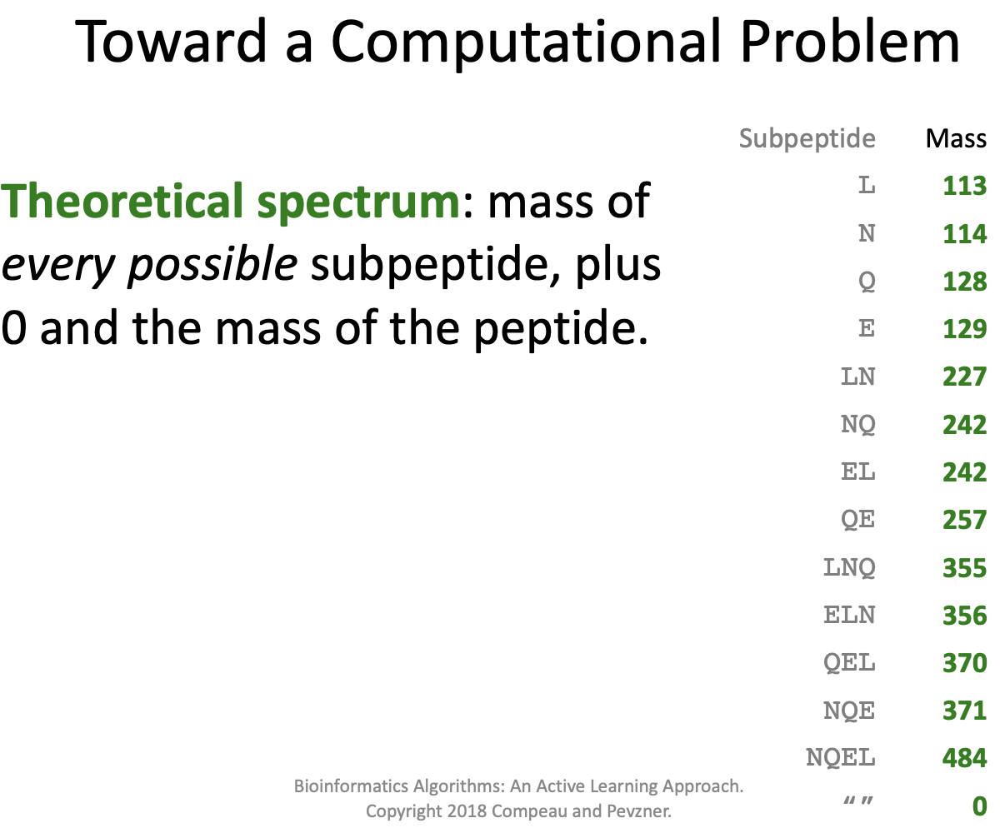

In [28]:
from itertools import combinations

In [29]:
# amino acid symbols and their masses
masses = {
    'G': 57,
    'A': 71,
    'S': 87,
    'P': 97,
    'V': 99,
    'T': 101,
    'C': 103,
    'I': 113,
    'L': 113,
    'N': 114,
    'D': 115,
    'K': 128,
    'Q': 128,
    'E': 129,
    'M': 131,
    'H': 137,
    'F': 147,
    'R': 156,
    'Y': 163,
    'W': 186
}


def all_combinations(string):
    """
    generate every substring combinations of the string
    """

    combs = []
    for n in range(0, len(string) + 1):
        n_combs = combinations(string, n)
        for n_comb in n_combs:
            combs.append(n_comb)
    return combs


def theoretical_spectrum(peptide):
    """
    generate theoretical spectrum from the peptide
    """

    cyclospectrum = dict()
    for subpeptide in all_combinations(peptide):
        mass = 0
        for amino_acid in subpeptide:
            mass += masses[amino_acid]
        cyclospectrum[subpeptide] = mass
    return cyclospectrum

In [30]:
theoretical_spectrum_test = theoretical_spectrum('NQEL')
print(theoretical_spectrum_test)

{(): 0, ('N',): 114, ('Q',): 128, ('E',): 129, ('L',): 113, ('N', 'Q'): 242, ('N', 'E'): 243, ('N', 'L'): 227, ('Q', 'E'): 257, ('Q', 'L'): 241, ('E', 'L'): 242, ('N', 'Q', 'E'): 371, ('N', 'Q', 'L'): 355, ('N', 'E', 'L'): 356, ('Q', 'E', 'L'): 370, ('N', 'Q', 'E', 'L'): 484}


### 15. Cyclopeptide scoring problem

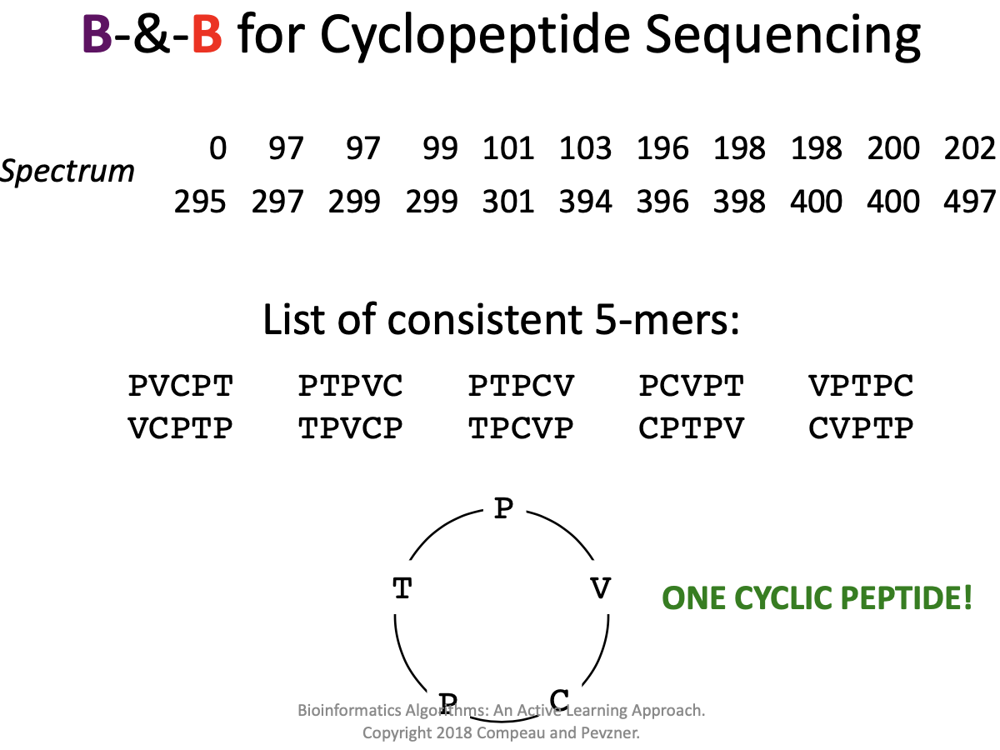

In [31]:
def find_cyclopeptides(spectrum, n):
    """
    find every cyclopeptide of length n from the spectrum
    """

    current_masses = dict()

    for i in range(n):
        if i == 0:
            for amino_acid, mass in masses.items():
                if mass in spectrum:
                    current_masses[amino_acid] = mass
        else:
            new_tuples = []

            for current_amino_acid, current_mass in current_masses.items():
                for amino_acid, mass in masses.items():
                    new_mass = current_mass + mass
                    if new_mass in spectrum:
                        new_tuples.append((current_amino_acid + amino_acid, new_mass))

            for amino_acid in list(current_masses):
                if len(amino_acid) < n:
                    current_masses.__delitem__(amino_acid)

            for amino_acid, mass in new_tuples:
                current_masses[amino_acid] = mass

    cyclopeptides = [c for c in current_masses.keys()]
    return cyclopeptides


def distance(peptide1, peptide2):
    """
    difference between the two peptides
    """

    d = 0
    for i in range(len(peptide1)):
        if peptide1[i] != peptide2[i]:
            d += 1
    return d


def cyclopeptide_scoring(spectrum, peptide):
    """
    find peptide score and the best cyclopeptide on the spectrum
    """

    len_peptide = len(peptide)
    min_dist = len_peptide
    best_cyclopeptide = None

    for cyclopeptide in find_cyclopeptides(spectrum, len_peptide):
        dist = distance(peptide, cyclopeptide)
        if dist < min_dist:
            min_dist = dist
            best_cyclopeptide = cyclopeptide

    return min_dist, best_cyclopeptide

In [32]:
cyclopeptide_scoring_test = cyclopeptide_scoring(
    [
        0, 97, 97, 99, 101, 103, 196, 198, 198, 200, 202, 295,
        297, 299, 299, 301, 394, 396, 398, 400, 400, 497
    ], 'PVCPG')
print(cyclopeptide_scoring_test)

(1, 'PVCPT')


### 16. Longest common subsequence problem

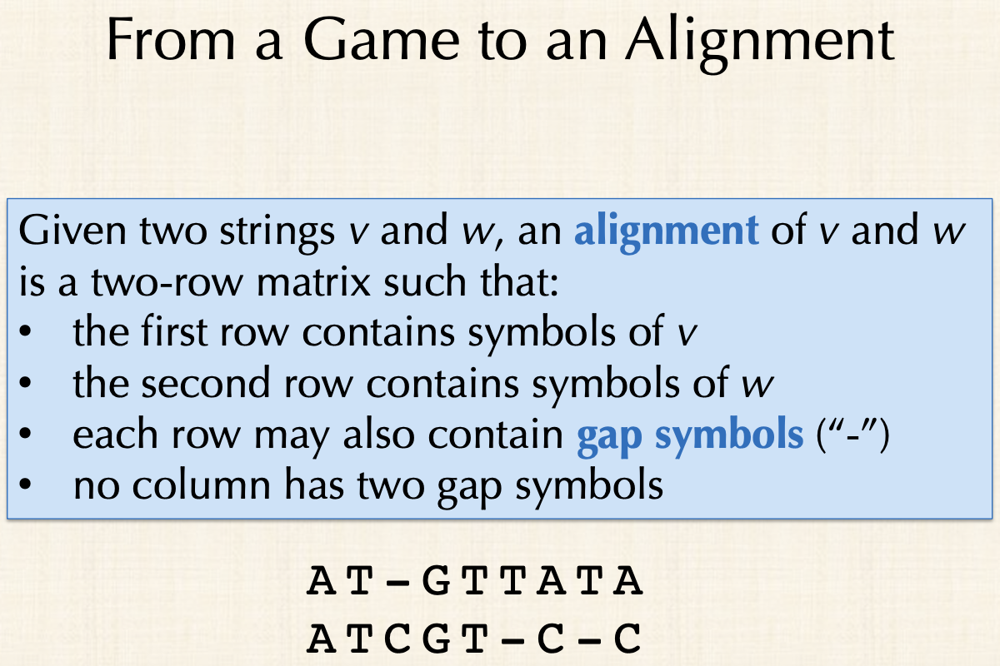

In [33]:
def longest_common_subsequence(str1, str2):
    """
    find a longest common subsequence of str1 and str2 where letters are
    not necessarily contiguous
    """
    len_str1 = len(str1)
    len_str2 = len(str2)
    min_len = min(len_str1, len_str2)
    indices1 = [i for i in range(len_str1)]
    indices2 = [i for i in range(len_str2)]

    # look for subsequences at lengths in descending order
    for length in range(min_len, 0, -1):
        # check all combinations of indices of the given length
        combs1 = [comb for comb in combinations(indices1, length)]
        combs2 = [comb for comb in combinations(indices2, length)]

        for comb1 in combs1:
            subsequence1 = ''
            for i in comb1:
                subsequence1 += str1[i]

            for comb2 in combs2:
                subsequence2 = ''
                for i in comb2:
                    subsequence2 += str2[i]

                # check if the combinations match
                if subsequence1 == subsequence2:
                    # since one longest common subsequence is asked
                    # and length is descending, the first encounter is returned
                    return subsequence1

    # if not found, return none
    return None

In [34]:
lcs_test = longest_common_subsequence('atgttata', 'atcgtcc')
print(lcs_test)

atgt


### 17. Global alignment problem

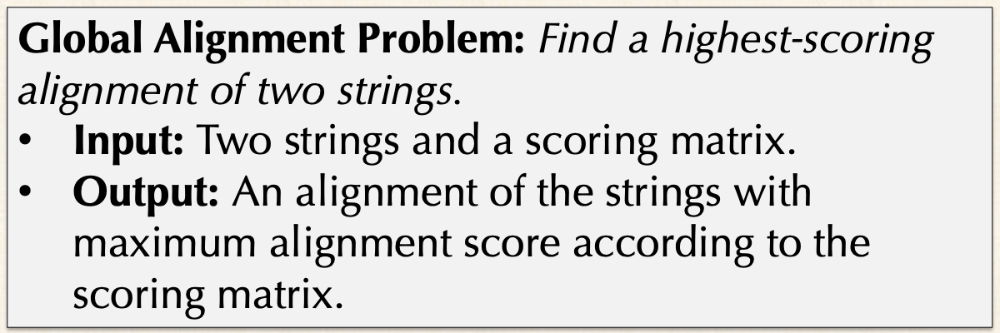

In [35]:
MR = 1       # match reward
MMP = -3     # mismatch penalty
IDP = -2     # insertion/deletion penalty
EMPTY = '-'  # empty symbols used in alignments
scoring_matrix = {
    'a': {'a': MR, 'c': MMP, 'g': MMP, 't': MMP, EMPTY: IDP},
    'c': {'a': MMP, 'c': MR, 'g': MMP, 't': MMP, EMPTY: IDP},
    'g': {'a': MMP, 'c': MMP, 'g': MR, 't': MMP, EMPTY: IDP},
    't': {'a': MMP, 'c': MMP, 'g': MMP, 't': MR, EMPTY: IDP},
    EMPTY:  {'a': IDP, 'c': IDP, 'g': IDP, 't': IDP, EMPTY: IDP},
}

def get_alignments(comb1, comb2, str1, str2, len_str1, len_str2):
    """
    given longest common sequence index combinations from two strings,
    find the corresponding alignments a1 and a2
    """
    a1 = ''
    a2 = ''
    i1 = 0
    i2 = 0
    i_common = 0
    n_common = len(comb1)

    while True:
        # case 1: all the common letters are finished
        if i_common == n_common:

            # append the rest of the strings
            for i in range(i1, len_str1):
                a1 += str1[i]
            for i in range(i2, len_str2):
                a2 += str2[i]

            # fill out the gaps with -
            diff = len(a1) - len(a2)
            if diff < 0:
                a1 += EMPTY * -diff
            else:
                a2 += EMPTY * diff
            break

        i1_common = comb1[i_common]
        i2_common = comb2[i_common]

        # case 2: common letter encountered
        if i1 == i1_common and i2 == i2_common:
            letter = str1[i1]
            a1 += letter
            a2 += letter
            i1 += 1
            i2 += 1
            i_common += 1

        # case 3: both strings are behind the common letter
        elif i1 < i1_common and i2 < i2_common:
            a1 += str1[i1]
            a2 += str2[i2]
            i1 += 1
            i2 += 1

        # case 4: string 1 is behind but string 2 is at the common letter
        elif i1 < i1_common and i2 == i2_common:
            a1 += str1[i1]
            a2 += EMPTY
            i1 += 1

        # case 5: string 2 is behind but string 1 is at the common letter
        elif i1 == i1_common and i2 < i2_common:
            a1 += EMPTY
            a2 += str2[i2]
            i2 += 1

    return a1, a2


def alignment_score(a1, a2, scoring_matrix):
    """
    determine score of alignments a1 and a2 using scoring matrix
    """
    score = 0
    length = len(a1)
    for i in range(length):
        score += scoring_matrix[a1[i]][a2[i]]
    return score

def global_alignment(str1, str2, score):
    """
    find the best global alignment of str1 and str2 using scoring matrix score
    """
    # note that the function works slower in large strings

    len_str1 = len(str1)
    len_str2 = len(str2)
    min_len = min(len_str1, len_str2)
    indices1 = [i for i in range(len_str1)]
    indices2 = [i for i in range(len_str2)]
    best_alignments = None
    max_score = -9999

    for length in range(min_len, 0, -1):
        # check all combinations of indices of the given length
        combs1 = [comb for comb in combinations(indices1, length)]
        combs2 = [comb for comb in combinations(indices2, length)]

        for comb1 in combs1:
            subsequence1 = ''
            for i in comb1:
                subsequence1 += str1[i]

            for comb2 in combs2:
                subsequence2 = ''
                for i in comb2:
                    subsequence2 += str2[i]

                # check if the combinations match
                if subsequence1 == subsequence2:
                    # if a common subsequence is encountered, get the corresponding alignments
                    a1, a2 = get_alignments(comb1, comb2, str1, str2, len_str1, len_str2)
                    # then, find the score
                    score_of_alignments = alignment_score(a1, a2, score)
                    # if its better than the current solution, note down the alignments
                    if score_of_alignments > max_score:
                        max_score = score_of_alignments
                        best_alignments = a1, a2

    return best_alignments, max_score

In [36]:
global_alignment_test = global_alignment('atgttata', 'atcgtcc', scoring_matrix)
print(global_alignment_test)

(('at-gttata', 'atcgtcc--'), -8)


### 18. Number of breakpoints problem

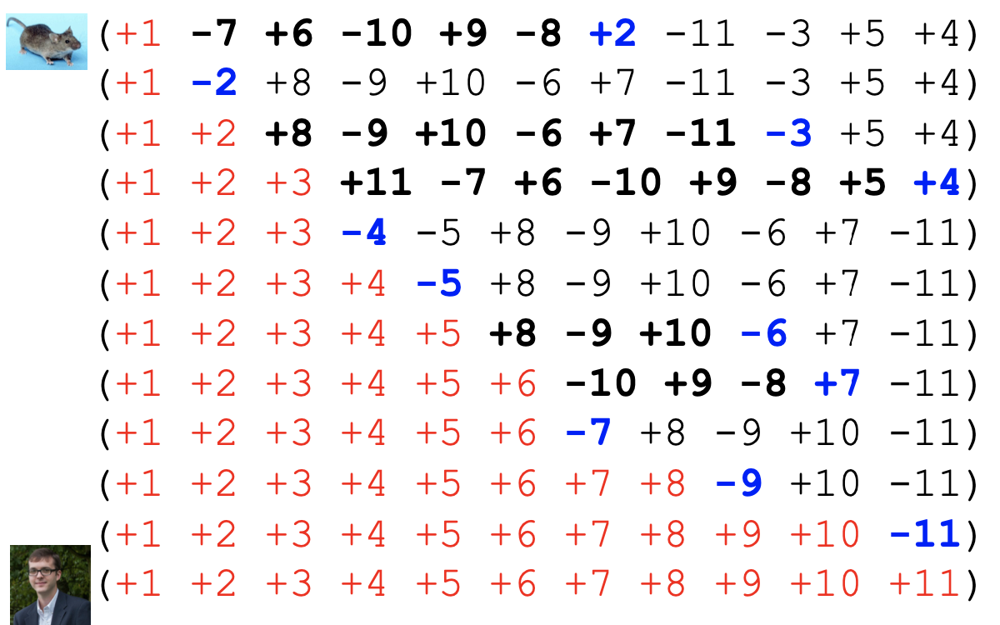

In [37]:
def reversal(p, start, end):
    """
    swap signs and positions of elements of p between start and end, inclusively
    """
    length = end - start + 1
    half_length = length // 2
    for i in range(half_length):
        temp = p[start + i]
        p[start + i] = -p[end - i]
        p[end - i] = -temp

    # reverse the middle element
    if length % 2 == 1:
        p[start + half_length] *= -1

def number_of_breakpoints(p):
    """
    greedy approach for finding number of breakpoints required to
    sort permutation p into [1, 2, ..., n] with reversals
    """
    n_breakpoints = 0
    len_p = len(p)
    current_index = 0
    steps = [p.copy()]

    while current_index < len_p:
        supposed_value = current_index + 1
        if p[current_index] == supposed_value:
            # previous indices are already sorted, check next indices
            current_index += 1
        else:
            # look for absolute value of the number
            for i in range(current_index, len_p):
                if abs(p[i]) == supposed_value:
                    # reverse and check the index again
                    reversal(p, current_index, i)
                    steps.append(p.copy())
                    n_breakpoints += 1
                    break

    return n_breakpoints, steps

In [38]:
number_of_breakpoints_test = number_of_breakpoints([1, -7, 6, -10, 9, -8, 2, -11, -3, 5, 4])
print(number_of_breakpoints_test)

(11, [[1, -7, 6, -10, 9, -8, 2, -11, -3, 5, 4], [1, -2, 8, -9, 10, -6, 7, -11, -3, 5, 4], [1, 2, 8, -9, 10, -6, 7, -11, -3, 5, 4], [1, 2, 3, 11, -7, 6, -10, 9, -8, 5, 4], [1, 2, 3, -4, -5, 8, -9, 10, -6, 7, -11], [1, 2, 3, 4, -5, 8, -9, 10, -6, 7, -11], [1, 2, 3, 4, 5, 8, -9, 10, -6, 7, -11], [1, 2, 3, 4, 5, 6, -10, 9, -8, 7, -11], [1, 2, 3, 4, 5, 6, -7, 8, -9, 10, -11], [1, 2, 3, 4, 5, 6, 7, 8, -9, 10, -11], [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, -11], [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]])


### 19. Additive phylogeny

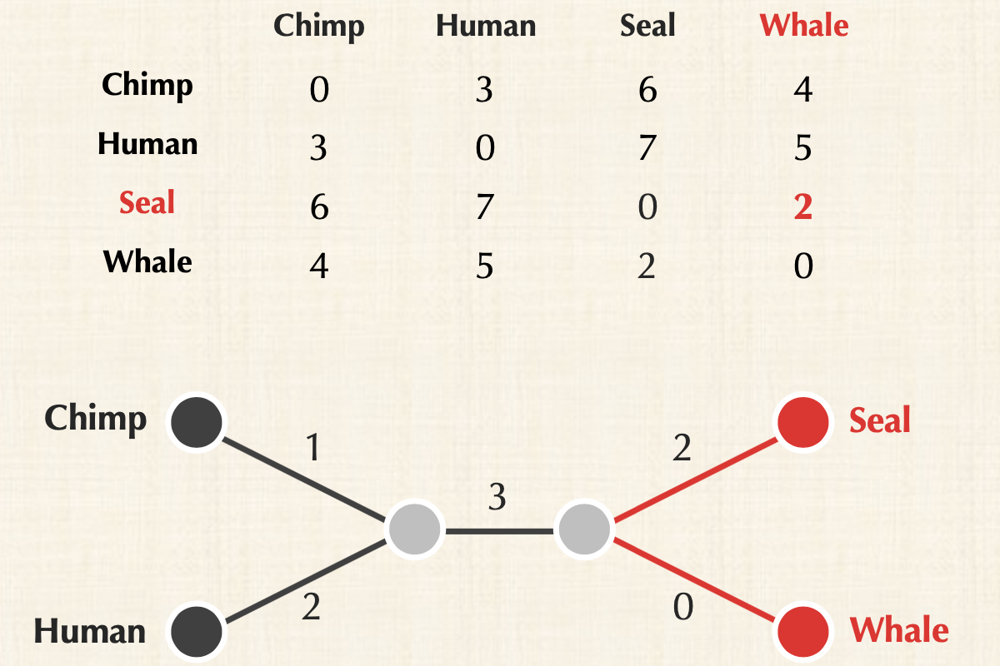

In [39]:
class Tree:
    def __init__(self):
        # dictionary of dictionaries showing nodes, edges and distances
        self.distances = {}

        # incrementing id for generated nodes
        self.auto_id = 0

    def add_edge(self, node1, node2, distance):
        # add node2 to node1's edges with the given distance
        if node1 not in self.distances:
            self.distances[node1] = {}
        self.distances[node1][node2] = distance

    def connect(self, new_connections):
        # create the new node
        new_node = 'n%d' % self.auto_id
        self.auto_id += 1

        # establish connections with the new node
        for other_node, dist in new_connections.items():
            self.add_edge(other_node, new_node, dist)

    def connect_cluster(self, new_connections):
        name = '{'
        for node_name in new_connections.keys():
            if node_name[0] != '{':
                name += node_name + ','
        name = name[:-1] + '}'

        # establish connections with the new node
        for other_node, dist in new_connections.items():
            self.add_edge(other_node, name, dist)

    def __str__(self):
        # print the edges and distances of the tree
        string = ''
        for node1, node1_distances in self.distances.items():
            for node2, dist in node1_distances.items():
                string += '%s-%s: %.1f\n' % (node1, node2, dist)
        return string

def evolutionary_tree_recursive(tree, current_matrix, name_list, n_steps=0):
    """
    recursion for creating evolutionary tree editing distance matrix
    """

    # base case: connected tree
    flag = False
    for name in name_list:
        if name[0] != 'n':
            flag = True
            break
    if not flag:
        return tree

    # find the minimum distance within the non-generated nodes
    sz = len(current_matrix)
    min_i, min_j, min_dist = 0, 0, 4095
    for i in range(sz):
        if name_list[i][0] == 'n':
            continue
        for j in range(i):
            dist = current_matrix[i][j]
            if i != j and dist < min_dist:
                min_i = i
                min_j = j
                min_dist = dist

    # find the distance between a minimum distanced node and the new node
    new_col = []
    other_indices = [min_i]
    for i in range(sz):
        if i != min_i and i != min_j:
            other_indices.append(i)
            break
    target_dist = abs(current_matrix[min_j][other_indices[0]] +
                      current_matrix[min_j][other_indices[1]] -
                      current_matrix[other_indices[0]][other_indices[1]]) / 2

    # find the distance of other nodes to the new node and add the new node
    for row in range(sz):
        if row == min_j:
            dist = target_dist
        else:
            dist = current_matrix[min_j][row] - target_dist
        current_matrix[row].append(dist)
        new_col.append(dist)
    new_col.append(0)
    current_matrix.append(new_col)

    # update the tree
    new_connections = {
        name_list[min_i]: current_matrix[min_i][-1],
        name_list[min_j]: current_matrix[min_j][-1]
    }
    name_list.append('n%d' % tree.auto_id)
    for i in range(n_steps):
        dist = current_matrix[min_i][-2-i] - current_matrix[min_i][-1]
        new_connections[name_list[-2-i]] = dist
    tree.connect(new_connections)

    # remove the pair
    current_matrix.pop(min_i)
    current_matrix.pop(min_j)
    name_list.pop(min_i)
    name_list.pop(min_j)
    for row in range(sz - 1):
        current_matrix[row].pop(min_i)
        current_matrix[row].pop(min_j)

    return evolutionary_tree_recursive(tree, current_matrix, name_list, n_steps + 1)

def additive_phylogeny(distance_matrix, name_list=None):
    """
    recursively generate an evolutionary tree fitting the distance matrix
    """

    # set up the parameters
    tree = Tree()
    current_matrix = distance_matrix.copy()
    if name_list is None:
        name_list = ['x%d' % i for i in range(len(distance_matrix))]

    # recursively generate the tree
    return evolutionary_tree_recursive(tree, current_matrix, name_list)

In [40]:
additive_phylogeny_test = additive_phylogeny(
    [
        [0, 3, 6, 4],
        [3, 0, 7, 5],
        [6, 7, 0, 2],
        [4, 5, 2, 0]
    ],
    ['Chimp', 'Human', 'Seal', 'Whale']
)
print(additive_phylogeny_test)

Whale-n0: 0.0
Seal-n0: 2.0
Human-n1: 2.0
Chimp-n1: 1.0
n0-n1: 3.0



### 20. UPGMA

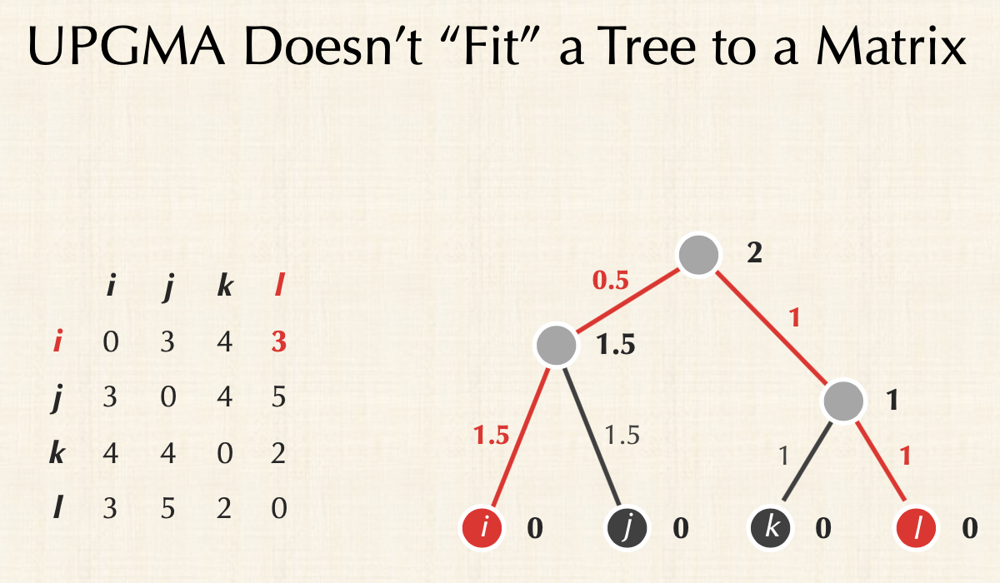

In [41]:
def upgma_recursive(tree, current_matrix, name_list, n_steps=0):
    """
    recursion for creating evolutionary tree editing distance matrix
    """

    # base case: connected tree
    flag = False
    for name in name_list:
        if name[0] != '{':
            flag = True
            break
    if not flag:
        return tree

    # find the minimum distance within the non-generated nodes
    sz = len(current_matrix)
    min_i, min_j, min_dist = 0, 0, 4095
    for i in range(sz):
        if name_list[i][0] == '{':
            continue
        for j in range(i):
            dist = current_matrix[i][j]
            if i != j and dist < min_dist:
                min_i = i
                min_j = j
                min_dist = dist

    # add new nodes and their distances
    new_col = []
    target_dist = current_matrix[min_i][min_j] / 2
    for row in range(sz):
        # distance of minimum distanced nodes is half the minimum distance
        if row == min_i or row == min_j:
            dist = target_dist
        # distance of other nodes are average distance to the two nodes
        else:
            dist = (current_matrix[row][min_i] + current_matrix[row][min_j]) / 2
        current_matrix[row].append(dist)
        new_col.append(dist)
    new_col.append(0)
    current_matrix.append(new_col)

    # update the tree
    new_connections = {
        name_list[min_i]: current_matrix[min_i][-1],
        name_list[min_j]: current_matrix[min_j][-1]
    }
    name_list.append('{%s,%s}' % (name_list[min_i], name_list[min_j]))
    for i in range(n_steps):
        dist = current_matrix[min_i][-2-i] - current_matrix[min_i][-1]
        new_connections[name_list[-2-i]] = dist
    tree.connect_cluster(new_connections)

    # remove the pair
    current_matrix.pop(min_i)
    current_matrix.pop(min_j)
    name_list.pop(min_i)
    name_list.pop(min_j)
    for row in range(sz - 1):
        current_matrix[row].pop(min_i)
        current_matrix[row].pop(min_j)

    return upgma_recursive(tree, current_matrix, name_list, n_steps + 1)

def upgma(distance_matrix, name_list=None):
    # set up the parameters
    tree = Tree()
    current_matrix = distance_matrix.copy()
    if name_list is None:
        name_list = ['x%d' % i for i in range(len(distance_matrix))]

    # recursively generate the tree
    return upgma_recursive(tree, current_matrix, name_list)

In [42]:
upgma_test = upgma(
    [
        [0, 3, 4, 3],
        [3, 0, 4, 5],
        [4, 4, 0, 2],
        [3, 5, 2, 0]
    ],
    ['i', 'j', 'k', 'l']
)
print(upgma_test)

l-{l,k}: 1.0
k-{l,k}: 1.0
j-{j,i}: 1.5
i-{j,i}: 1.5
{l,k}-{j,i}: 3.0



### 21. k-means clustering problem

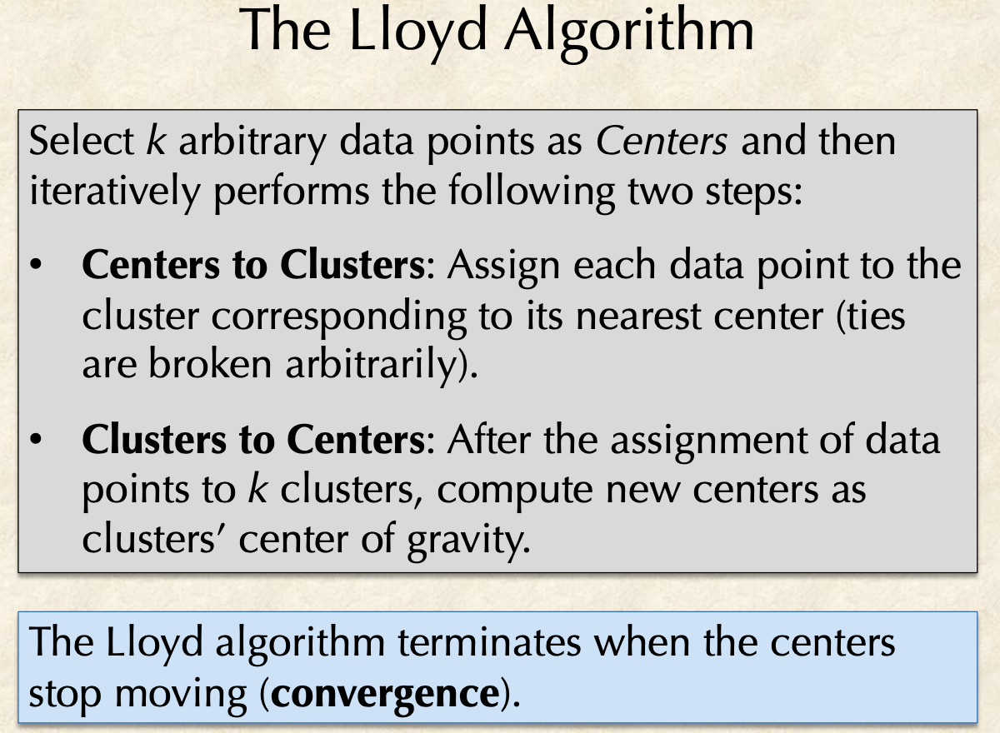

In [43]:
class Point:
    def __init__(self, x, y):
        self.x = x
        self.y = y

    def dist(self, point):
        return ((self.x - point.x) ** 2 + (self.y - point.y) ** 2) ** 0.5

    def __eq__(self, point):
        return self.x == point.x and self.y == point.y

    def __repr__(self):
        return '(%.2f,%.2f)' % (self.x, self.y)


def k_means_clustering(data, k):
    """
    find k-means clustering of point set data with the given k
    """

    len_data = len(data)
    centers = []

    # assign points as random points from the data as the initial centers
    indices = [i for i in range(len_data)]
    len_indices = len_data
    for i in range(k):
        random_index = indices.pop(randrange(0, len_indices))
        len_indices -= 1
        centers.append(data[random_index])

    while True:

        # reassign points to centers
        clusters = [[] for _ in range(k)]
        for point in data:
            # find closest center to the point
            min_dist = 4095
            min_index = 0
            for i in range(k):
                dist = point.dist(centers[i])
                if dist < min_dist:
                    min_dist = dist
                    min_index = i
            # assign the point to the cluster
            clusters[min_index].append(point)

        # update centers
        new_centers = []
        for i in range(k):
            # find the center of gravity
            avg_x, avg_y = 0.0, 0.0
            n_points = len(clusters[i])
            for point in clusters[i]:
                avg_x += point.x
                avg_y += point.y
            avg_x /= n_points
            avg_y /= n_points
            new_centers.append(Point(avg_x, avg_y))

        # check convergence
        same_centers = True
        for i in range(k):
            if centers[i] != new_centers[i]:
                same_centers = False
                break

        # if the centers doesn't change, the algorithm converged
        if same_centers:
            return centers, clusters

        # if the centers changed, update the centers and continue
        centers = new_centers

In [44]:
k_means_clustering_test = k_means_clustering([
    Point(0, 0), Point(0, 1), Point(1, 0),
    Point(5, 6), Point(6, 5), Point(-5, 10),
    Point(-6, 10), Point(6, 6), Point(-6, 11)
], 3)
print(k_means_clustering_test)

([(-5.67,10.33), (0.33,0.33), (5.67,5.67)], [[(-5.00,10.00), (-6.00,10.00), (-6.00,11.00)], [(0.00,0.00), (0.00,1.00), (1.00,0.00)], [(5.00,6.00), (6.00,5.00), (6.00,6.00)]])


### 22. Hierarchical clustering problem

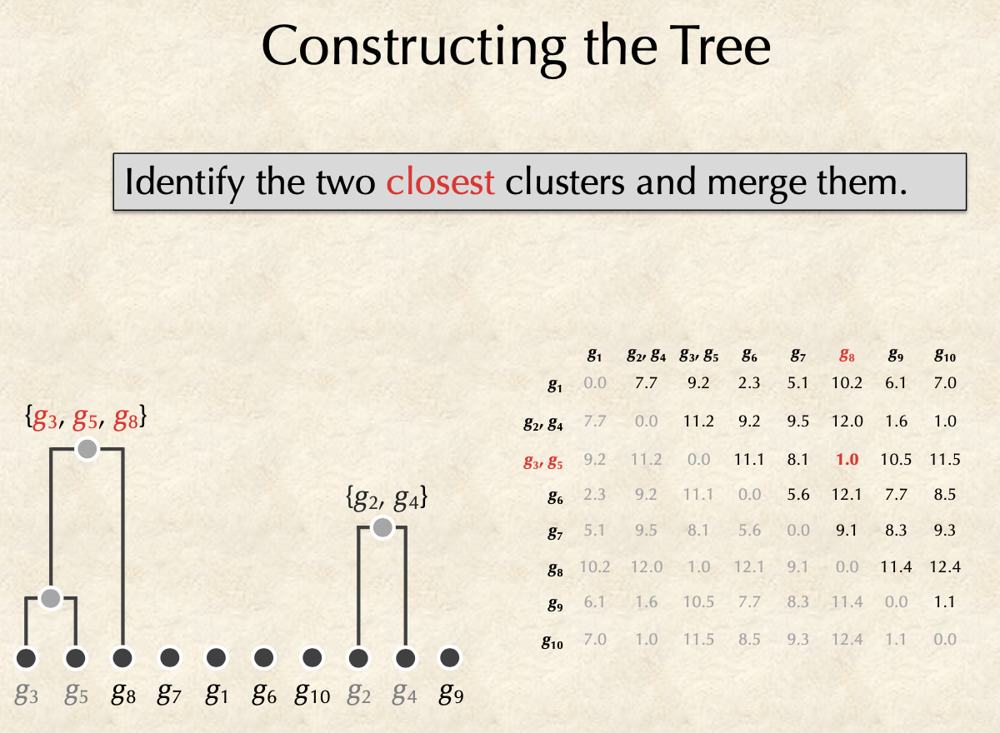

In [45]:
def hierarchical_clustering(dist_matrix, n=0):
    len_dist_matrix = len(dist_matrix)
    names = ['%s' % (i + 1) for i in range(len_dist_matrix)]
    sizes = [1 for _ in range(len_dist_matrix)]

    while len_dist_matrix > 1:
        # find minimum distance
        min_dist = 4095
        min_index = None
        for i in range(len_dist_matrix):
            for j in range(i):
                dist = dist_matrix[i][j]
                if dist < min_dist:
                    min_dist = dist
                    min_index = (i, j)

        # find new column's distances
        new_column = []
        for i in range(len_dist_matrix):
            if i != min_index[0] and i != min_index[1]:
                # weighted average distance
                dist = (sizes[min_index[0]] * dist_matrix[min_index[0]][i] +
                        sizes[min_index[1]] * dist_matrix[min_index[1]][i]) / \
                       (sizes[min_index[0]] + sizes[min_index[1]])
                new_column.append(dist)

        # remove old clusters
        new_name = '{'
        new_size = 0
        for index in min_index:
            dist_matrix.pop(index)
            new_name += '%s,' % names.pop(index)
            new_size += sizes.pop(index)
        new_name = new_name[:-1] + '}'
        for i in range(len_dist_matrix - 2):
            for index in min_index:
                dist_matrix[i].pop(index)

        # attach new cluster
        dist_matrix.append(new_column + [0])
        for i in range(len_dist_matrix - 2):
            dist_matrix[i].append(new_column[i])
        names.append(new_name)
        sizes.append(new_size)

        # update the size
        len_dist_matrix -= 1

    return names[0]

In [46]:
hierarchical_clustering_test = hierarchical_clustering([
    [0.0, 8.1, 9.2, 7.7, 9.3, 2.3, 5.1, 10.2, 6.1, 7.0],
    [8.1, 0.0, 12.0, 0.9, 12.0, 9.5, 10.1, 12.8, 2.0, 1.0],
    [9.2, 12.0, 0.0, 11.2, 0.7, 11.1, 8.1, 1.1, 10.5, 11.5],
    [7.7, 0.9, 11.2, 0.0, 11.2, 9.2, 9.5, 12.0, 1.6, 1.1],
    [9.3, 12.0, 0.7, 11.2, 0.0, 11.2, 8.5, 1.0, 10.6, 11.6],
    [2.3, 9.5, 11.1, 9.2, 11.2, 0.0, 5.6, 12.1, 7.7, 8.5],
    [5.1, 10.1, 8.1, 9.5, 8.5, 5.6, 0.0, 9.1, 8.3, 9.3],
    [10.2, 12.8, 1.1, 12.0, 1.0, 12.1, 9.1, 0.0, 11.4, 12.4],
    [6.1, 2.0, 10.5, 1.6, 10.6, 7.7, 8.3, 11.4, 0.0, 1.1],
    [7.0, 1.0, 11.5, 1.1, 11.6, 8.5, 9.3, 12.4, 1.1, 0.0]
], 10)
print(hierarchical_clustering_test)

{{{{6,1},7},{{{4,2},10},9}},{{5,3},8}}


### 23. Trie construction problem

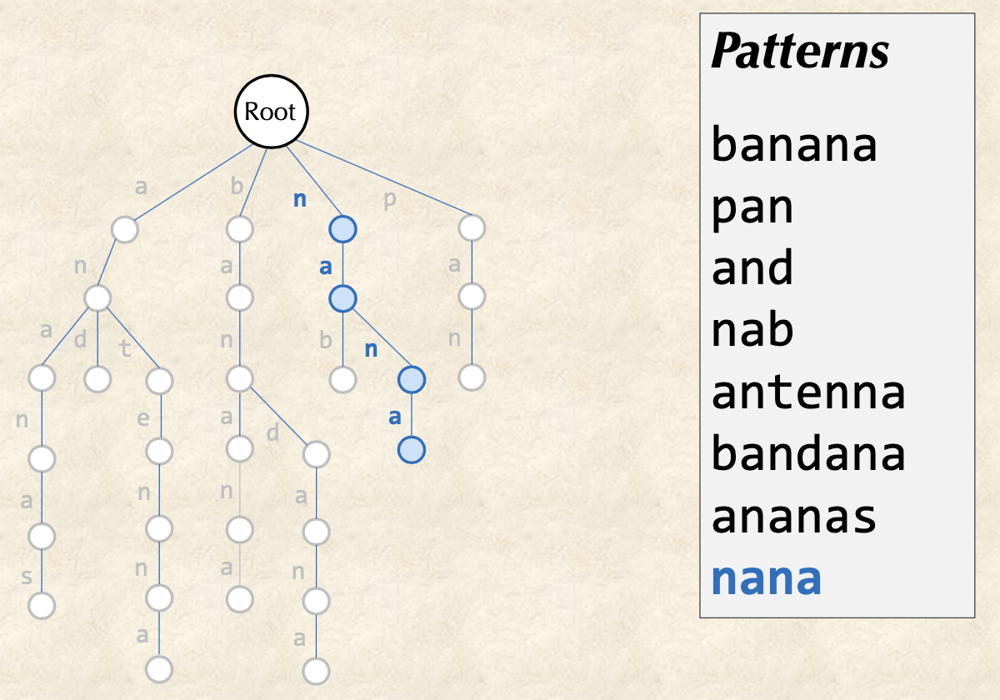

In [47]:
ROOT = 'root'
END_SIGN = '$'


class Trie:
    def __init__(self):
        self.edges = {ROOT: {}}

    def process_patterns(self, patterns):
        for pattern in patterns:
            len_pattern = len(pattern)
            current_node = self.edges[ROOT]
            for i in range(len_pattern):
                letter = pattern[i]
                if letter not in current_node:
                    current_node[letter] = {}
                current_node = current_node[letter]

    def eliminate_middles(self):
        edits = self.eliminate_middles_edits(self.edges[ROOT], [])
        for root, current_child_string, current_child_node, child_string in edits:
            root[current_child_string] = current_child_node
            root.__delitem__(child_string)

    def eliminate_middles_edits(self, root, edits):
        for child_string, child_node in root.items():
            if len(child_node) > 1:
                self.eliminate_middles_edits(child_node, edits)
            elif len(child_node) == 1:
                current_child_string, current_child_node = child_string, child_node
                while len(current_child_node) == 1:
                    new_child = list(current_child_node.items())[0]
                    current_child_string += new_child[0]
                    current_child_node = new_child[1]
                edits.append((root, current_child_string, current_child_node, child_string))
                self.eliminate_middles_edits(current_child_node, edits)
            else:
                return edits

    def __str__(self):
        s = ''
        indentation = 0
        raw_str = self.edges.__str__()
        len_raw_str = len(raw_str)
        for i, c in enumerate(raw_str):
            if c not in ['\'', '{', '}', ',', ' ', ':']:
                s += c
            if c == ':' or c == '}':
                if c == ':':
                    indentation += 1
                else:
                    indentation -= 1
                if i < len_raw_str - 4 and raw_str[i + 4] not in ['\'', '{', '}', ',', ' ', ':']:
                    s += '\n' + indentation * '--'
        return s


def trie_construction(patterns):
    trie = Trie()
    trie.process_patterns(patterns)
    return trie

In [48]:
trie_construction_test = trie_construction([
    'banana', 'pan', 'and', 'nab',
    'antenna', 'bandana', 'ananas', 'nana'
])
print(trie_construction_test)

root
--b
----a
------n
--------a
----------n
------------a
--------d
----------a
------------n
--------------a
--p
----a
------n
--a
----n
------d
------t
--------e
----------n
------------n
--------------a
------a
--------n
----------a
------------s
--n
----a
------b
------n
--------a


### 24. Suffix tree construction problem

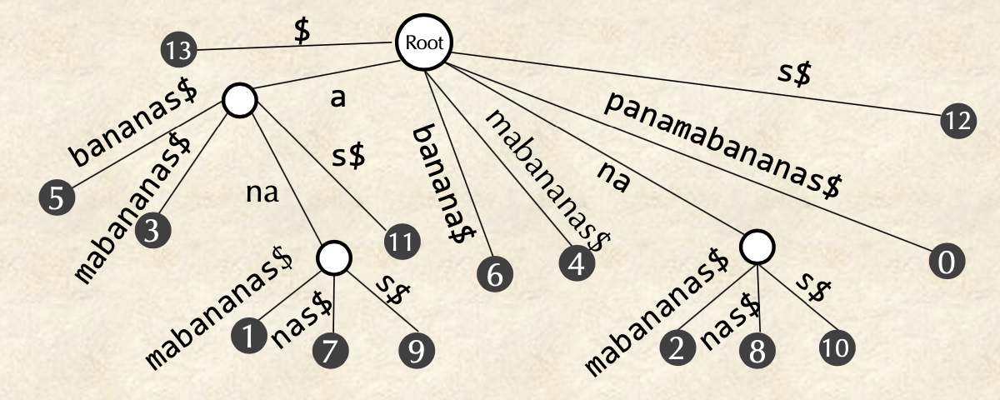

In [49]:
def suffix_tree_construction(pattern):
    if pattern[-1] != END_SIGN:
        pattern = pattern + END_SIGN
    patterns = [pattern[i:] for i in range(len(pattern))]

    trie = Trie()
    trie.process_patterns(patterns)
    trie.eliminate_middles()

    return trie

In [50]:
suffix_tree_construction_test = suffix_tree_construction('panamabananas')
print(suffix_tree_construction_test)

root
--a
----na
------mabananas$
------nas$
------s$
----mabananas$
----bananas$
----s$
--$
--panamabananas$
--na
----mabananas$
----nas$
----s$
--mabananas$
--bananas$
--s$
